In [ ]:
"""
This notebook is directed to train arabic trocr and finetune the english one
"""

In [1]:
!pip install roboflow
!pip install -q datasets jiwer transformers
!pip install evaluate

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.3/85.3 kB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 58.6 MB/s eta 0:00:0000:0100:01
  Attempting uninstall: idna
    Found existing installation: idna 3.10
    Uninstalling idna-3.10:
      Successfully uninstalled idna-3.10
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow-decision-forests 1.10.0 requires tensorflow==2.17.0, but you have tensorflow 2.17.1 which is incompatible.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.2/98.2 kB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 46.8 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.0/84.0 kB 3.3 MB/s eta 0:00:00


In [2]:
from roboflow import Roboflow
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os

## Data handling

In [3]:
rf = Roboflow(api_key="DIMiJPktWsGdNtddEtQo")

project = rf.workspace("neoeliotix").project("medicalhandwrittenprescription")
dataset = project.version(6).download("yolov8")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to MedicalHandwrittenPrescription--6 in yolov8:: 100%|██████████| 2482/2482 [00:01<00:00, 1363.94it/s]


In [4]:
src_folder = '/kaggle/input/macathon'

df1 = pd.read_excel(f'{src_folder}/Train_With_entities.xlsx')
df2 = pd.read_excel(f'{src_folder}/test_phase_1_with_entities.xlsx')
df3 = pd.read_excel(f'{src_folder}/Test_phase_2.xlsx')

df1['Medicine'] = df1['Medicines']
df1['Appointment'] = df1['Appointments']
df1.drop(columns=['Medicines', 'Appointments'], inplace=True)

df = pd.concat([df1, df2, df3], ignore_index=True)
df.head()

,Prescription,Pairs,Image,Medicine,Appointment
0,Carbachol Every 8 hours,"[('Carbachol', 'Every 8 hours')]",Ophthalmology_prescription_1,Carbachol,Every 8 hours
1,"Ofloxacin كل ست ساعات , Brimonidine كل ٦ ساعا...","[('Ofloxacin', 'كل ٦ ساعات'), ('Brimonidine', ...",Ophthalmology_prescription_2,"Ofloxacin , Brimonidine , كارباشول , Latanoprost","كل ٦ ساعات , كل ٦ ساعات , عند اللزوم , مرة يومياً"
2,Brimonidine Before breakfast,"[('Brimonidine', 'Before breakfast')]",Ophthalmology_prescription_3,Brimonidine,Before breakfast
3,"Carbachol عند اللزوم , Tobramycin عند اللزوم ,...","[('Carbachol', 'عند اللزوم'), ('Tobramycin', '...",Ophthalmology_prescription_4,"Carbachol , Tobramycin , Pilocarpine , لاتانوب...","عند اللزوم , عند اللزوم , كل ٦ ساعات , قبل النوم"
4,"Fluorometholone As needed , Latanoprost As needed","[('Fluorometholone', 'As needed'), ('Latanopro...",Ophthalmology_prescription_5,"Fluorometholone , Latanoprost","As needed , As needed"


In [5]:
df.drop(columns=['Pairs'], inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1242 entries, 0 to 1241
Data columns (total 4 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Prescription  1242 non-null   object
 1   Image         1242 non-null   object
 2   Medicine      1242 non-null   object
 3   Appointment   1242 non-null   object
dtypes: object(4)
memory usage: 38.9+ KB


In [6]:
classes = {
    'Arabic':0,
    'English':1,
    'Frequency':2,
    'Medicine':3
}

In [7]:
def get_base_name(file_path):
  parent_dir = os.path.dirname(file_path)
  file_name = os.path.basename(file_path)
  ext = os.path.splitext(file_name)[1]
  base_name = file_name.split(f'_{ext[1:]}')[0]
  return base_name.split('-')[0]


def iou(b1, b2):
  x1, y1, x2, y2 = b1
  x3, y3, x4, y4 = b2

  area1 = (x2 - x1) * (y2 - y1)
  area2 = (x4 - x3) * (y4 - y3)

  intersection_x1 = max(x1, x3)
  intersection_y1 = max(y1, y3)
  intersection_x2 = min(x2, x4)
  intersection_y2 = min(y2, y4)

  intersection_area = max(0, intersection_x2 - intersection_x1) * max(0, intersection_y2 - intersection_y1)

  union_area = area1 + area2 - intersection_area

  return intersection_area / union_area

def get_region_info(id1, id2):
  # get class names from the ids
  class_name1 = list(classes.keys())[int(id1)]
  class_name2 = list(classes.keys())[int(id2)]
  # extract language and whether the region has frequency or medication
  # lang=None
  prescription_type=None
  if id1 <= 1:
    lang = class_name1
  else:
    prescription_type = class_name1

  if id2 <= 1:
    lang = class_name2
  else:
    prescription_type = class_name2
  # if lang==None:
  #   lang = 'English'
  if prescription_type==None:
    prescription_type = 'Medicine'
  return lang, prescription_type


def polygon_to_bbox(polygon_points):
    # polygon_points = [x1, y1, x2, y2, ..., xn, yn] (normalized)
    xs = [float(polygon_points[i]) for i in range(0, len(polygon_points), 2)]
    ys = [float(polygon_points[i]) for i in range(1, len(polygon_points), 2)]

    x_min, x_max = min(xs), max(xs)
    y_min, y_max = min(ys), max(ys)

    x_center = (x_min + x_max) / 2
    y_center = (y_min + y_max) / 2

    w = x_max - x_min
    h = y_max - y_min

    return x_center, y_center, w, h

In [8]:
def yolo2txt(img_path, df):
  base_name = get_base_name(img_path)
  
  # if no entry in the dataframe
  if df.Image.isin([base_name]).any()==False:
    print("No valid entry in the dataframe", img_path)
    return img_path

  img = cv2.imread(img_path)
  h, w, _ = img.shape

  # get the list of medicines and the appointments
  medicines = df[df.Image==base_name]['Medicine'].values
  medicines = str(medicines).strip('[]').strip("'").split(',')
  medicines = [medicine.strip() for medicine in medicines]
  medicine_index = 0

  frequencies = df[df.Image==base_name]['Appointment'].values
  frequencies = str(frequencies).strip('[]').strip("'").split(',')
  frequencies = [frequency.strip() for frequency in frequencies]
  frequency_index = 0

  # get correct label path
  label_path = img_path.replace('.jpg', '.txt').replace('/images/', '/labels/')
  with open(label_path, 'r') as f:
    lines = f.readlines()

  # sort lines according to y
  lines = sorted(lines, key=lambda x: float(x.split()[2]))
  bbox = []
  class_ids = []
  num_med = 0
  num_freq = 0
  num_lang=0
  num_types=0
  # loop on lines to get information
  for i in range(len(lines)):
    line = lines[i].strip().split()
    if len(line)==5:
      class_id, x, y, width, height = map(float, line)
    else:
      class_id = float(line[0])
      x, y, width, height = polygon_to_bbox(line[1:])

    # get ROI
    x1 = int((x - width/2) * w)
    y1 = int((y - height/2) * h)

    x2 = int((x + width/2) * w)
    y2 = int((y + height/2) * h)

    bbox.append((x1, y1, x2, y2))
    class_ids.append(class_id)

    if class_id == 2:
      num_freq += 1
    elif class_id == 3:
      num_med += 1

    if class_id <= 1:
      num_lang += 1
    else:
      num_types += 1

  # when the number of medicines not equal to the umber of frequencies, missalignment will happen
  if num_lang != num_types:
    print(img_path)
    return img_path

  if num_freq != num_med:
    print(img_path)
    return img_path

  parts = []
  for i in range(len(bbox)):
    for j in range(i+1, len(bbox)):
      if iou(bbox[i], bbox[j]) > 0.3: # extract the info when the boxes refer to the same region
        lang, prescription_type = get_region_info(class_ids[i], class_ids[j])

        # get the label of the ROI
        if(prescription_type=='Medicine'):
          label = medicines[medicine_index]
          medicine_index += 1
        else:
          label = frequencies[frequency_index]
          frequency_index += 1

        # add the label with the other info into the list
        parts.append((bbox[i], (prescription_type, lang), label))
        break

    if frequency_index == len(frequencies) and medicine_index == len(medicines):
      break
  return parts

In [9]:
def make_train_valid_test(arabic, english):
  # make a folder for english labels and antoher for arabic ones
  os.makedirs(os.path.join(english, 'train/images'), exist_ok=True)
  os.makedirs(os.path.join(english, 'train/labels'), exist_ok=True)

  os.makedirs(os.path.join(arabic, 'train/images'), exist_ok=True)
  os.makedirs(os.path.join(arabic, 'train/labels'), exist_ok=True)

  os.makedirs(os.path.join(english, 'valid/images'), exist_ok=True)
  os.makedirs(os.path.join(english, 'valid/labels'), exist_ok=True)

  os.makedirs(os.path.join(arabic, 'valid/images'), exist_ok=True)
  os.makedirs(os.path.join(arabic, 'valid/labels'), exist_ok=True)

  os.makedirs(os.path.join(english, 'test/images'), exist_ok=True)
  os.makedirs(os.path.join(english, 'test/labels'), exist_ok=True)

  os.makedirs(os.path.join(arabic, 'test/images'), exist_ok=True)
  os.makedirs(os.path.join(arabic, 'test/labels'), exist_ok=True)


def write_label(file_path, txt):
  with open(file_path, 'w') as f:
    f.write(txt)


def write_images_labels(split, img_path, parts, arabic, english):
  counter = 0

  img = cv2.imread(img_path)
  file_name = get_base_name(img_path)

  for part in parts:
    x1, y1, x2, y2 = part[0]
    prescription_type, lang = part[1]
    label = part[2]

    cropped_img = img[y1:y2, x1:x2]
    if lang == 'Arabic':
      base_path = arabic
    else:
      base_path = english

    image_path = os.path.join(base_path, split, 'images', f'{file_name}_{counter}.jpg')
    label_path = os.path.join(base_path, split, 'labels', f'{file_name}_{counter}.txt')

    cv2.imwrite(image_path, cropped_img)
    write_label(label_path, label)

    counter += 1

In [10]:
def construct_dataset(src_folder, output_dir, df):
  train_image_paths = os.path.join(src_folder, 'train/images')
  valid_image_paths = os.path.join(src_folder, 'valid/images')
  test_image_paths = os.path.join(src_folder, 'test/images')

  english = os.path.join(output_dir, 'english')
  arabic = os.path.join(output_dir, 'arabic')

  make_train_valid_test(arabic, english)


  # make folders for images and labels
  problem_images = []
  for image_path in os.listdir(train_image_paths):
    img_path = os.path.join(train_image_paths, image_path)
    parts = yolo2txt(img_path, df)
    if type(parts) != str:
      write_images_labels('train', img_path, parts, arabic, english)
    else:
      problem_images.append(parts)


  for image_path in os.listdir(valid_image_paths):
    img_path = os.path.join(valid_image_paths, image_path)
    parts = yolo2txt(img_path, df)

    if type(parts) != str:
      write_images_labels('valid', img_path, parts, arabic, english)
    else:
      problem_images.append(parts)


  for image_path in os.listdir(test_image_paths):
    img_path = os.path.join(test_image_paths, image_path)
    parts = yolo2txt(img_path, df)

    if type(parts) != str:
      write_images_labels('test', img_path, parts, arabic, english)
    else:
      problem_images.append(parts)

In [11]:
construct_dataset('/kaggle/working/MedicalHandwrittenPrescription--6', '/kaggle/working/prescriptions', df)

/kaggle/working/MedicalHandwrittenPrescription--6/train/images/prescription_Gyne_20_jpg.rf.59fa32edc51f70df3f3cf45313f99326.jpg
No valid entry in the dataframe /kaggle/working/MedicalHandwrittenPrescription--6/valid/images/Beauty_prescription_60_jpg.rf.f5b0b375dafbf6ef213dbd7bbbb5c97d.jpg


In [12]:
path = '/kaggle/working/prescriptions/arabic/valid/labels'
max_len = 0
for file in os.listdir(path):
    full_path = os.path.join(path, file)
    with open(full_path, 'r') as f:
        lab = f.read()
        l = len(lab.strip())
        if l==0:
            print(full_path)
    max_len = max(max_len, l)
print(max_len)

21


In [13]:
problem_img = '/kaggle/working/MedicalHandwrittenPrescription--6/train/images/prescription_Gyne_20_jpg.rf.59fa32edc51f70df3f3cf45313f99326.jpg'

## configure the model

In [14]:
# import all libraries
from datasets import load_dataset
from torch.utils.data import Dataset
from PIL import Image
import torch
from transformers import TrOCRProcessor, AutoTokenizer, AutoFeatureExtractor
from transformers import VisionEncoderDecoderModel
from transformers import Seq2SeqTrainer, Seq2SeqTrainingArguments
from transformers import default_data_collator
from evaluate import load

In [15]:
class data(Dataset):
    def __init__(self, root_dir, processor, max_length=30):
        # self.dataa = dataa
        self.max_length = max_length
        self.processor = processor
        self.root_dir = root_dir
        self.images = os.listdir(os.path.join(self.root_dir, 'images'))
      
    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        file_name = self.images[idx]
        
        image_path = os.path.join(self.root_dir, 'images', file_name)
        label_path = image_path.replace('/images/', '/labels/').replace('.jpg', '.txt')
        
        image = Image.open(image_path).convert("RGB")
        with open(label_path, 'r') as f:
            text = f.read()
        # image = self.dataa[idx]['image'].convert('RGB')
        # text = self.dataa[idx]['text']
        #prepare images
        pixel_values = self.processor(image, return_tensors='pt').pixel_values
        #get the labels
        labels = self.processor.tokenizer(text,
                                          padding="max_length",
                                          max_length=self.max_length).input_ids
        labels = [label if label != self.processor.tokenizer.pad_token_id else -100 for label in labels]
        
        encoding = {"pixel_values": pixel_values.squeeze(), "labels": torch.tensor(labels).squeeze()}
        return encoding

In [16]:
# choosing feature extractor and tokenizer
# feature_extractor = AutoFeatureExtractor.from_pretrained("google/vit-base-patch16-384")
# # using multilingual roberta fine tuned on arabic is better
# decoder_tokenizer = AutoTokenizer.from_pretrained('xlm-roberta-base')

# processor = TrOCRProcessor(feature_extractor=feature_extractor, tokenizer=decoder_tokenizer)

In [17]:
# using multilingual mbart pretrained on arabic
# decoder_tokenizer = AutoTokenizer.from_pretrained('facebook/mbart-large-50')

# processor = TrOCRProcessor.from_pretrained('microsoft/trocr-base-handwritten')
# processor.tokenizer = decoder_tokenizer

# model = VisionEncoderDecoderModel.from_encoder_decoder_pretrained('google/vit-base-patch16-384',
                                                                 # 'facebook/mbart-large-50')

In [20]:
 # model = VisionEncoderDecoderModel.from_encoder_decoder_pretrained("google/vit-base-patch16-384", 'xlm-roberta-base')
processor = TrOCRProcessor.from_pretrained('microsoft/trocr-large-handwritten')
model = VisionEncoderDecoderModel.from_pretrained('microsoft/trocr-large-handwritten')
# trainer.optimizer.load_state_dict(optimizer_dir
# set decoder config to causal lm
model.config.decoder.is_decoder = True
model.config.decoder.add_cross_attention = True
# set special tokens used for creating the decoder_input_ids from the labels
model.config.decoder_start_token_id = processor.tokenizer.cls_token_id
model.config.pad_token_id = processor.tokenizer.pad_token_id
# make sure vocab size is set correctly
model.config.vocab_size = model.config.decoder.vocab_size

# set beam search parameters
model.config.eos_token_id = processor.tokenizer.sep_token_id
# make max_length = 64
model.config.max_length = 30
model.config.early_stopping = True
model.config.no_repeat_ngram_size = 2
model.config.length_penalty = 2.0
model.config.num_beams = 3

preprocessor_config.json:   0%|          | 0.00/224 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/1.12k [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/899k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/772 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/4.13k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/2.23G [00:00<?, ?B/s]

Config of the encoder: <class 'transformers.models.vit.modeling_vit.ViTModel'> is overwritten by shared encoder config: ViTConfig {
  "attention_probs_dropout_prob": 0.0,
  "encoder_stride": 16,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.0,
  "hidden_size": 1024,
  "image_size": 384,
  "initializer_range": 0.02,
  "intermediate_size": 4096,
  "layer_norm_eps": 1e-12,
  "model_type": "vit",
  "num_attention_heads": 16,
  "num_channels": 3,
  "num_hidden_layers": 24,
  "patch_size": 16,
  "qkv_bias": false,
  "transformers_version": "4.47.0"
}

Config of the decoder: <class 'transformers.models.trocr.modeling_trocr.TrOCRForCausalLM'> is overwritten by shared decoder config: TrOCRConfig {
  "activation_dropout": 0.0,
  "activation_function": "gelu",
  "add_cross_attention": true,
  "attention_dropout": 0.0,
  "bos_token_id": 0,
  "classifier_dropout": 0.0,
  "cross_attention_hidden_size": 1024,
  "d_model": 1024,
  "decoder_attention_heads": 16,
  "decoder_ffn_dim": 4096,
  "decod

generation_config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

In [21]:
train_dataset = data('/kaggle/working/prescriptions/english/train', processor)
validate_dataset = data('/kaggle/working/prescriptions/english/valid', processor)
test_dataset = data('/kaggle/working/prescriptions/english/test', processor)

In [22]:
import os
import gc
os.environ["WANDB_DISABLED"] = "true"
os.environ["PYTORCH_CUDA_ALLOC_CONF"] = "expandable_segments:True"

In [23]:
output_dir = '/kaggle/working/output/xlm_model'
# Define the training arguments for the Seq2SeqTrainer
training_args = Seq2SeqTrainingArguments(
    predict_with_generate=True,  # Enable generation mode during evaluation
    save_strategy='no',
    logging_dir="./logs",
    log_level="debug",
    per_device_train_batch_size=4,  # Batch size for training data (per device) 8 was used for the arabic one
    per_device_eval_batch_size=4,   # Batch size for evaluation data (per device) 8 was used for the arabic one
    fp16= True,  # Enable mixed-precision training for faster training on supported GPUs
    output_dir= output_dir,  # Directory to save checkpoints and logs
    num_train_epochs=1,  # Total number of training epochs
    disable_tqdm=False,  # Show progress bar
    # weight_decay=1e-4,               # strength of weight decay 
    # learning_rate=1e-5,
    prediction_loss_only=False,
    report_to = 'none',
)

# for arabic ocr
# trial 1 -> 1e-4 false
# trial 2 -> 1e-5 false
# trial 3 -> 1e-2 -> 1e-3 -> 1e-4 (good)
# trial 4 -> 1e-2 -> 1e-3 -> 1e-4 -> none with accumlation steps
# trial 5 -> 1e-2 -> 1e-3 -> 1e-4 -> 1e-5 with acc steps

In [24]:
from evaluate import load
cer_metric = load("cer")
wer_metric = load("wer")
# accuracy_metric = load("accuracy")
def compute_metrics(pred):
    labels_ids = pred.label_ids
    pred_ids = pred.predictions  # <- This could be a tuple or dict, not just logits!

    if isinstance(pred_ids, tuple):
        pred_ids = pred_ids[0]  # Extract logits if tuple

    pred_str = processor.batch_decode(pred_ids, skip_special_tokens=True)
    labels_ids[labels_ids == -100] = processor.tokenizer.pad_token_id
    label_str = processor.batch_decode(labels_ids, skip_special_tokens=True)

    cer = cer_metric.compute(predictions=pred_str, references=label_str)
    wer = wer_metric.compute(predictions=pred_str, references=label_str)
        
    return {"cer": cer, "wer": wer}

In [25]:
# Load the checkpointed model
# model = VisionEncoderDecoderModel.from_pretrained('/kaggle/working/output/xlm_model')
# processor = TrOCRProcessor.from_pretrained('/kaggle/working/output/xlm_model')

# instantiate trainer
trainer = Seq2SeqTrainer(
    model=model,
    args=training_args,
    compute_metrics=compute_metrics,
    train_dataset=train_dataset,
    eval_dataset=validate_dataset,
    data_collator=default_data_collator
)
# trainer.optimizer.load_state_dict(optimizer_dir)

Using auto half precision backend


In [26]:
import warnings
warnings.filterwarnings("ignore", message=".*Trainer.tokenizer is now deprecated.*")

In [27]:
# trainer.train(resume_from_checkpoint=True)
save_directory = '/kaggle/working/output/xlm_model'
epochs = 9
epoch_num = 0
previous_cer = 20

In [28]:
optimizer_dir = f'{save_directory}/optimizer'

metrics_dir = f'{save_directory}/metrics'
metrics_file = os.path.join(metrics_dir, 'metrics.txt')
os.makedirs(metrics_dir, exist_ok=True)

In [29]:
for i in range(3):
    print("epoch num:",epoch_num)
    trainer.train()
    epoch_num = epoch_num + 1
    
    if i%2==0:
        results = trainer.predict(validate_dataset, num_beams=4)
        metrics = results[2]
        cer = metrics['test_cer']
        wer = metrics['test_wer']
        print("cer:", cer, "wer:", wer)
        if cer < previous_cer:
            model.save_pretrained(save_directory)
            processor.save_pretrained(save_directory)
            torch.save(trainer.optimizer.state_dict(), optimizer_dir)
            with open(metrics_file, 'a') as f:
                f.write(f"cer: {cer}, wer: {wer}\n")
            previous_cer = cer
    
    gc.collect()
    torch.cuda.empty_cache()

epoch num: 0


Currently training with a batch size of: 8
***** Running training *****
  Num examples = 2,287
  Num Epochs = 1
  Instantaneous batch size per device = 4
  Training with DataParallel so batch size has been adjusted to: 8
  Total train batch size (w. parallel, distributed & accumulation) = 16
  Gradient Accumulation steps = 2
  Total optimization steps = 143
  Number of trainable parameters = 558,226,432
Was asked to gather along dimension 0, but all input tensors were scalars; will instead unsqueeze and return a vector.


Step,Training Loss




Training completed. Do not forget to share your model on huggingface.co/models =)



***** Running Prediction *****
  Num examples = 638
  Batch size = 8
Generate config GenerationConfig {
  "decoder_start_token_id": 0,
  "early_stopping": true,
  "eos_token_id": 2,
  "length_penalty": 2.0,
  "max_length": 30,
  "no_repeat_ngram_size": 2,
  "num_beams": 3,
  "pad_token_id": 1
}

You have modified the pretrained model configuration to control generation. This is a deprecated strategy to control generation and will be removed in v5. Please use and modify the model generation configuration (see https://huggingface.co/docs/transformers/generation_strategies#default-text-generation-configuration )
Trainer.tokenizer is now deprecated. You should use Trainer.processing_class instead.


Trainer.tokenizer is now deprecated. You should use Trainer.processing_class instead.
Trainer.tokenizer is now deprecated. You should use Trainer.processing_class instead.
Trainer.tokenizer is now deprecated. You should use Trainer.processing_class instead.
Trainer.tokenizer is now deprecated. You should use Trainer.processing_class instead.
Trainer.tokenizer is now deprecated. You should use Trainer.processing_class instead.
Trainer.tokenizer is now deprecated. You should use Trainer.processing_class instead.
Trainer.tokenizer is now deprecated. You should use Trainer.processing_class instead.
Trainer.tokenizer is now deprecated. You should use Trainer.processing_class instead.
Trainer.tokenizer is now deprecated. You should use Trainer.processing_class instead.
Trainer.tokenizer is now deprecated. You should use Trainer.processing_class instead.
Trainer.tokenizer is now deprecated. You should use Trainer.processing_class instead.
Trainer.tokenizer is now deprecated. You should use Tr

cer: 0.048698232834210174 wer: 0.0703862660944206


Model weights saved in /kaggle/working/output/xlm_model/model.safetensors
Image processor saved in /kaggle/working/output/xlm_model/preprocessor_config.json
tokenizer config file saved in /kaggle/working/output/xlm_model/tokenizer_config.json
Special tokens file saved in /kaggle/working/output/xlm_model/special_tokens_map.json


epoch num: 1


Currently training with a batch size of: 8
***** Running training *****
  Num examples = 2,287
  Num Epochs = 1
  Instantaneous batch size per device = 4
  Training with DataParallel so batch size has been adjusted to: 8
  Total train batch size (w. parallel, distributed & accumulation) = 16
  Gradient Accumulation steps = 2
  Total optimization steps = 143
  Number of trainable parameters = 558,226,432
Was asked to gather along dimension 0, but all input tensors were scalars; will instead unsqueeze and return a vector.


Step,Training Loss




Training completed. Do not forget to share your model on huggingface.co/models =)


Currently training with a batch size of: 8
***** Running training *****
  Num examples = 2,287
  Num Epochs = 1
  Instantaneous batch size per device = 4
  Training with DataParallel so batch size has been adjusted to: 8
  Total train batch size (w. parallel, distributed & accumulation) = 16
  Gradient Accumulation steps = 2
  Total optimization steps = 143
  Number of trainable parameters = 558,226,432


epoch num: 2


Step,Training Loss




Training completed. Do not forget to share your model on huggingface.co/models =)



***** Running Prediction *****
  Num examples = 638
  Batch size = 8
Trainer.tokenizer is now deprecated. You should use Trainer.processing_class instead.


Trainer.tokenizer is now deprecated. You should use Trainer.processing_class instead.
Trainer.tokenizer is now deprecated. You should use Trainer.processing_class instead.
Trainer.tokenizer is now deprecated. You should use Trainer.processing_class instead.
Trainer.tokenizer is now deprecated. You should use Trainer.processing_class instead.
Trainer.tokenizer is now deprecated. You should use Trainer.processing_class instead.
Trainer.tokenizer is now deprecated. You should use Trainer.processing_class instead.
Trainer.tokenizer is now deprecated. You should use Trainer.processing_class instead.
Trainer.tokenizer is now deprecated. You should use Trainer.processing_class instead.
Trainer.tokenizer is now deprecated. You should use Trainer.processing_class instead.
Trainer.tokenizer is now deprecated. You should use Trainer.processing_class instead.
Trainer.tokenizer is now deprecated. You should use Trainer.processing_class instead.
Trainer.tokenizer is now deprecated. You should use Tr

cer: 0.04896802913800081 wer: 0.06866952789699571


In [30]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)
def predict_path(image_path, processor, model):
    image = Image.open(image_path).convert('RGB')
    plt.imshow(image)
    pixel_values = processor(image, return_tensors="pt").pixel_values
    pixel_values = pixel_values.to(device)
    ids = model.generate(pixel_values)
    decoded = processor.batch_decode(ids, skip_special_tokens=True)
    print(decoded)
    plt.show()
def predict(image):
    plt.imshow(image)
    pixel_values = processor(image, return_tensors="pt").pixel_values
    pixel_values = pixel_values.to(device)
    ids = model.generate(pixel_values)
    return processor.batch_decode(ids, skip_special_tokens=True)

In [37]:
test_processor = TrOCRProcessor.from_pretrained('/kaggle/working/output/xlm_model')
test_model = VisionEncoderDecoderModel.from_pretrained('/kaggle/working/output/xlm_model')
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
test_model = test_model.to(device)

loading configuration file /kaggle/working/output/xlm_model/preprocessor_config.json
Image processor ViTImageProcessor {
  "do_convert_rgb": null,
  "do_normalize": true,
  "do_rescale": true,
  "do_resize": true,
  "image_mean": [
    0.5,
    0.5,
    0.5
  ],
  "image_processor_type": "ViTImageProcessor",
  "image_std": [
    0.5,
    0.5,
    0.5
  ],
  "processor_class": "TrOCRProcessor",
  "resample": 2,
  "rescale_factor": 0.00392156862745098,
  "size": {
    "height": 384,
    "width": 384
  }
}

loading file vocab.json
loading file merges.txt
loading file tokenizer.json
loading file added_tokens.json
loading file special_tokens_map.json
loading file tokenizer_config.json
loading file chat_template.jinja
Processor TrOCRProcessor:
- image_processor: ViTImageProcessor {
  "do_convert_rgb": null,
  "do_normalize": true,
  "do_rescale": true,
  "do_resize": true,
  "image_mean": [
    0.5,
    0.5,
    0.5
  ],
  "image_processor_type": "ViTImageProcessor",
  "image_std": [
    0.5

In [31]:
import random
base_dir = '/kaggle/working/prescriptions/english/test/images'
lis = os.listdir(base_dir)

['Every 8 hours']


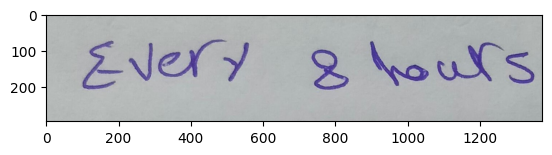

['Before breakfast']


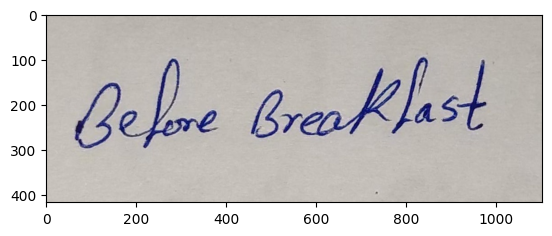

['After lunch']


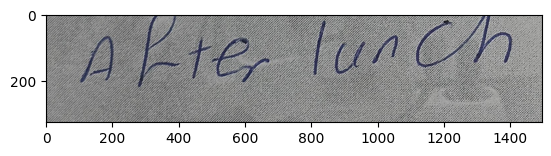

['Calcium Carbonate']


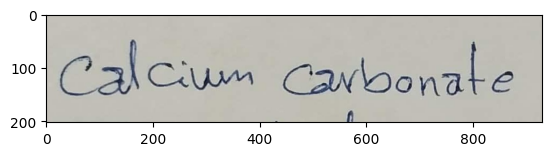

['Before bedtime']


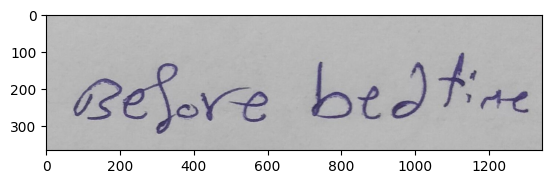

['Artificial Tears']


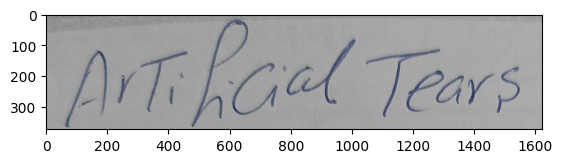

['Every other day']


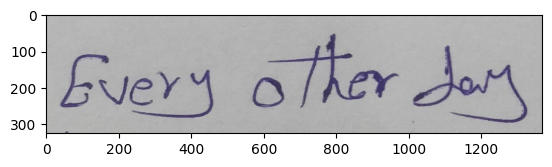

['Morning only']


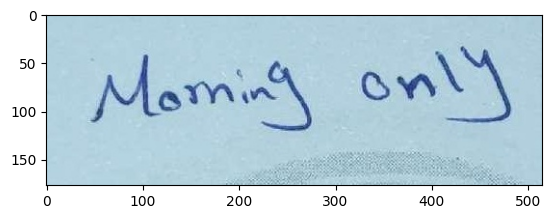

['Hydroquinone']


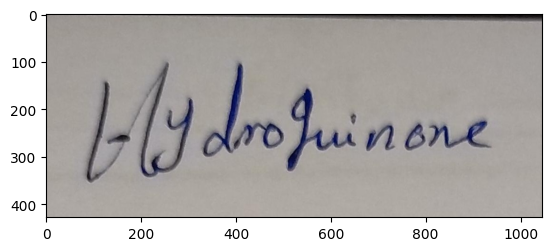

['Clindamycin']


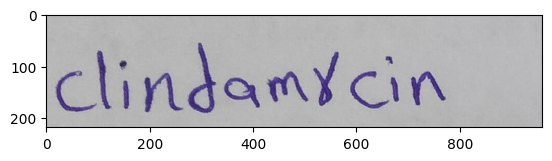

['Diclofenac']


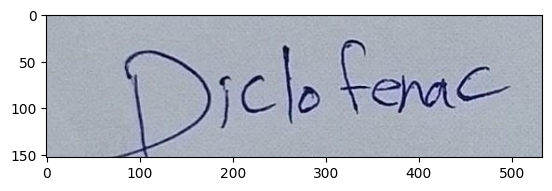

['Twice daily']


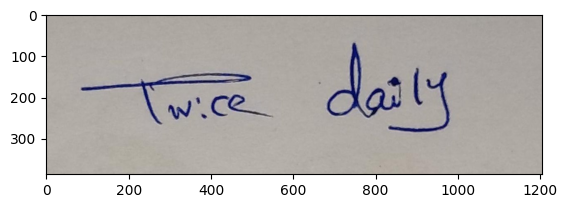

['Every 12 hours']


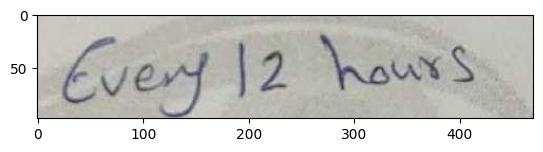

['Bimatropost']


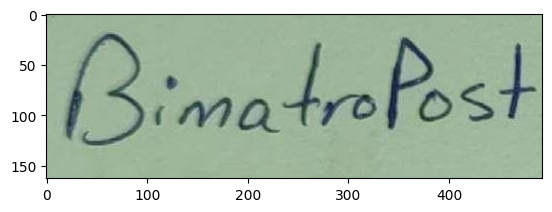

['Calcium Carbonate']


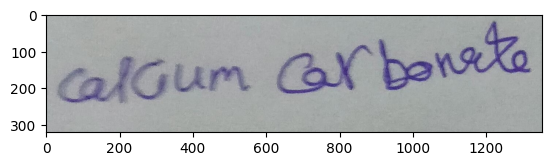

['Twice daily']


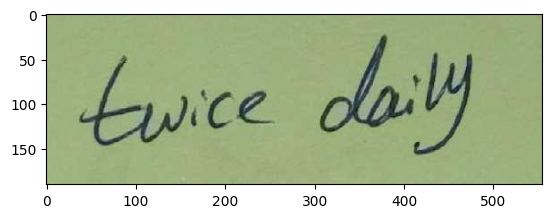

['Ranitidine']


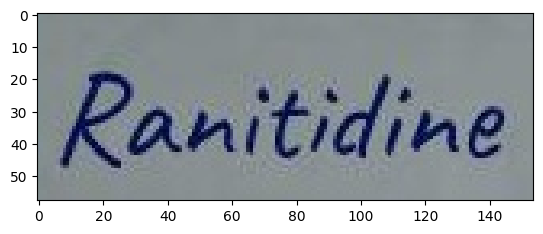

['Every 8 hours']


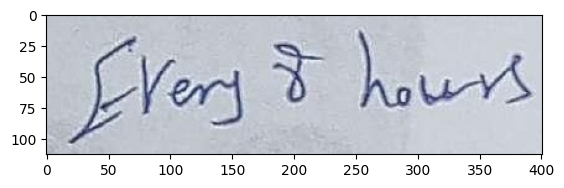

['Tobramycin']


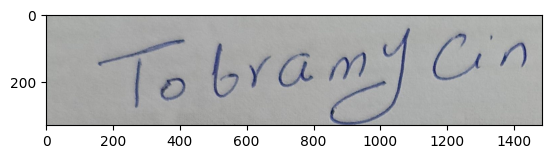

['Mupirocin']


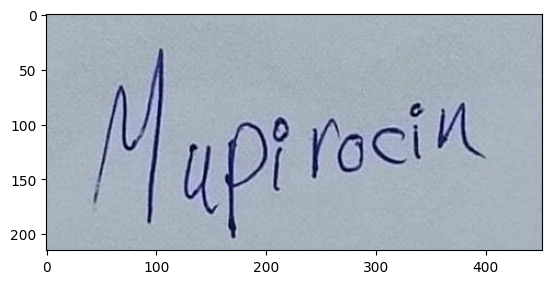

['Diclofinac']


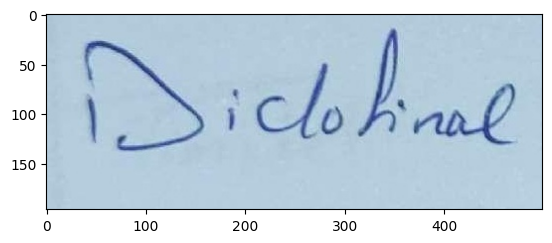

['Vitamin D']


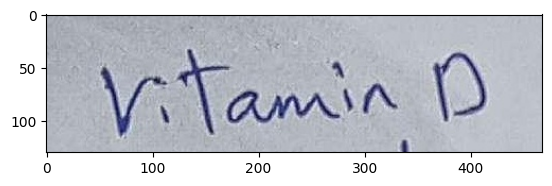

['Tobramycin']


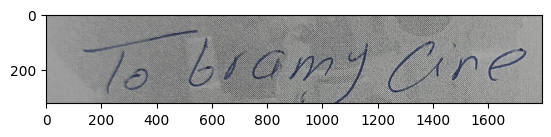

['After meals']


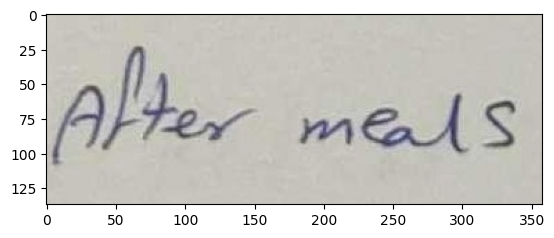

['Lactic Acid']


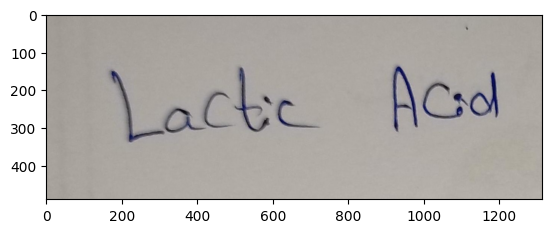

['Albendazole']


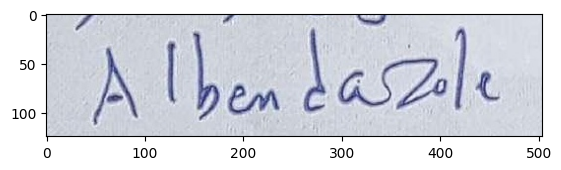

['Every other day']


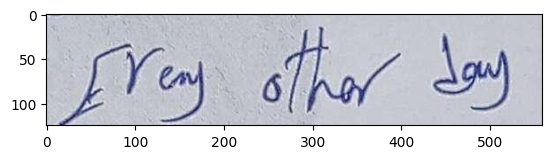

['Domipezil']


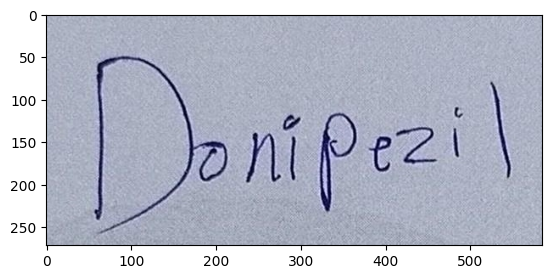

['Prednisolone Drops']


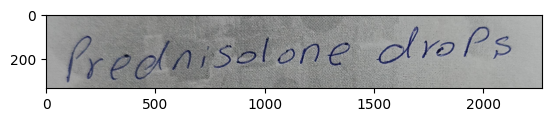

['Once daily']


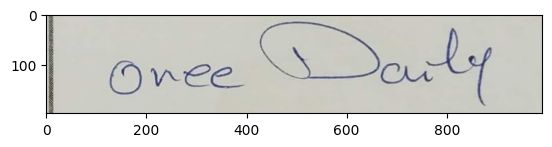

['Twice daily']


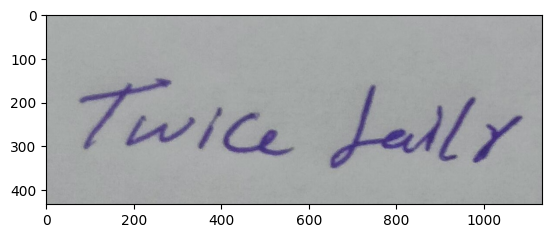

['Artificial Tears']


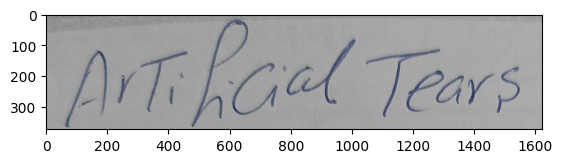

['As needed']


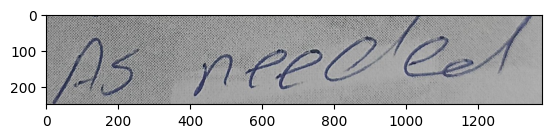

['Every week']


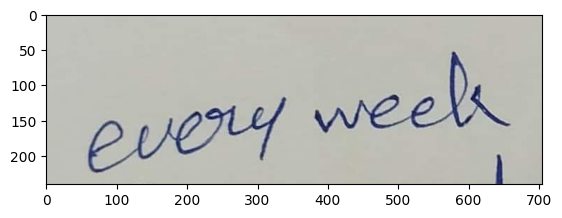

['Twice daily']


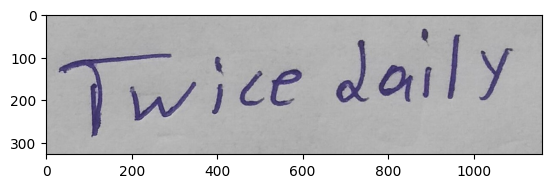

['Every 8 hours']


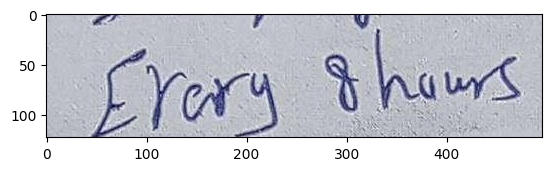

['Every 12 hours']


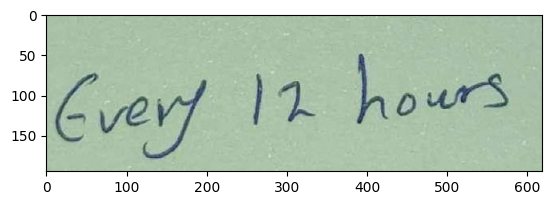

['Every 4 hours']


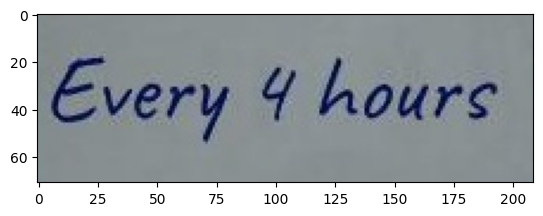

['For 7 days']


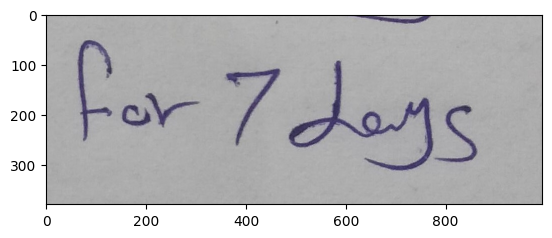

['Niacinamide']


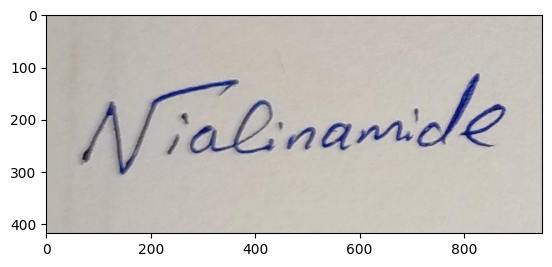

['Pilocarpine']


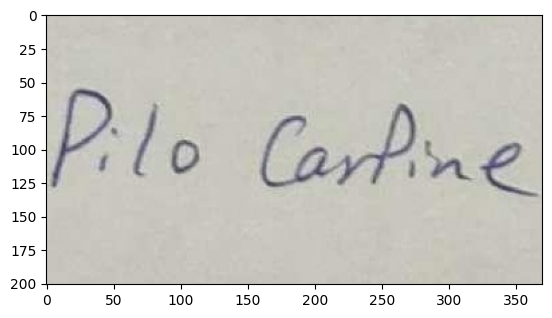

['Vitamin']


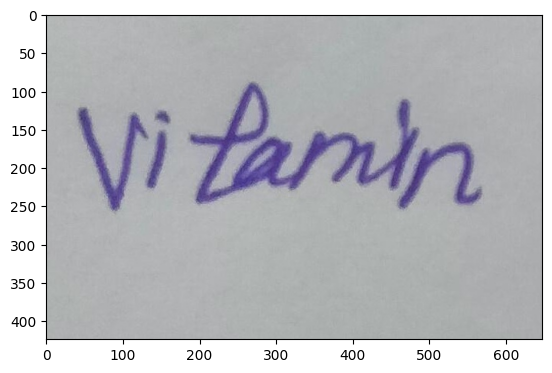

['Vitamin C Serum']


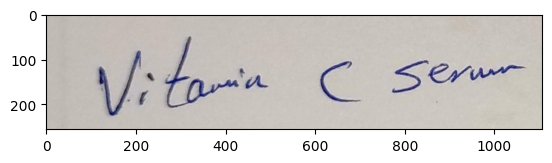

['Montelukast']


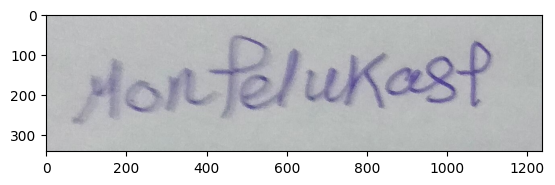

['As needed']


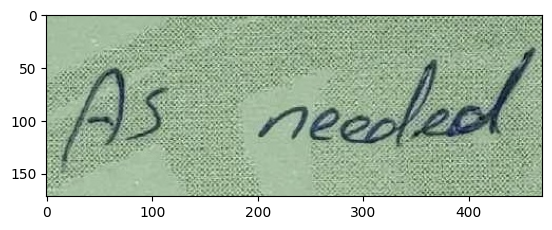

['Pilocarpine']


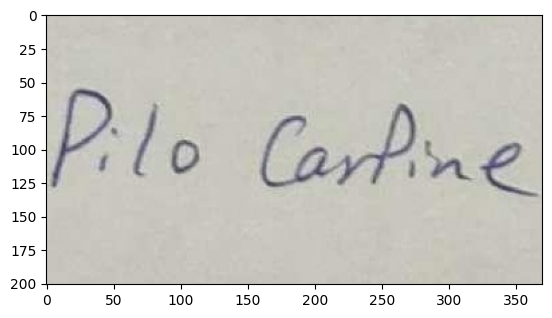

['Every 12 hours']


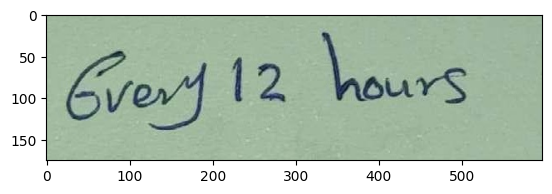

['Every 8 hours']


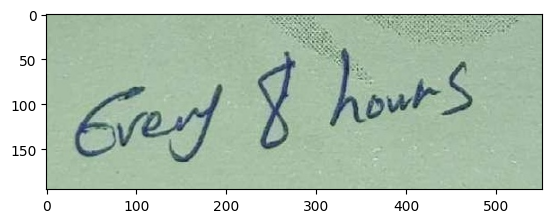

['After meals']


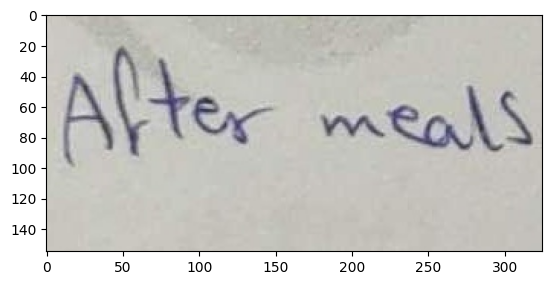

['Montelukast']


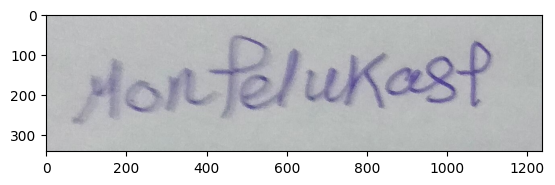

In [38]:
for i in range(50):
    path = os.path.join(base_dir, random.choice(lis))
    predict_path(path, test_processor, test_model)

['Twice daily']


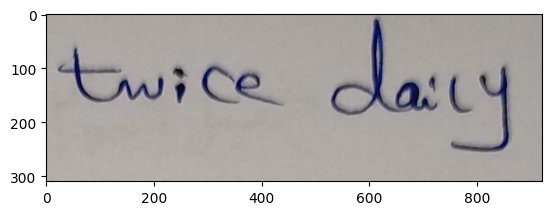

['Cefuroxime']


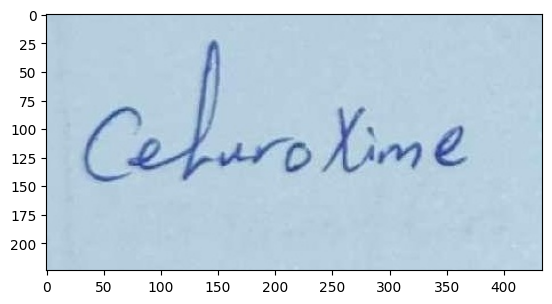

['Mupirocin']


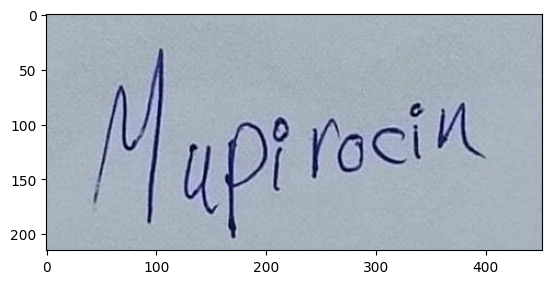

['Diclofenac']


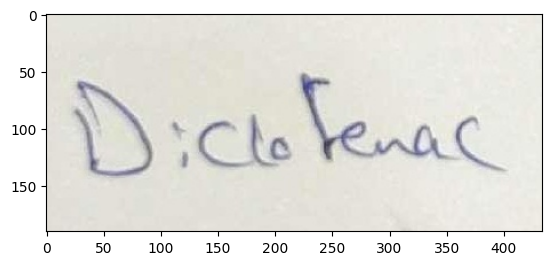

['Every 12 hours']


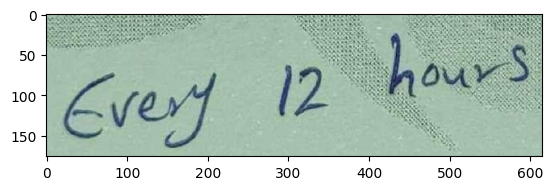

['For 7 days']


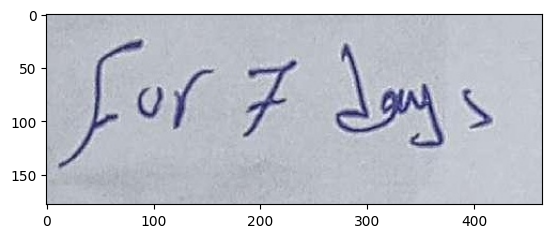

['Dorzolamide']


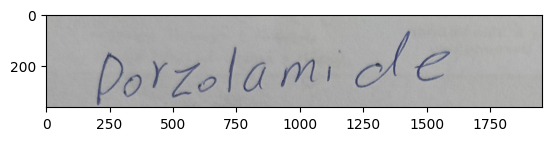

['For 7 days']


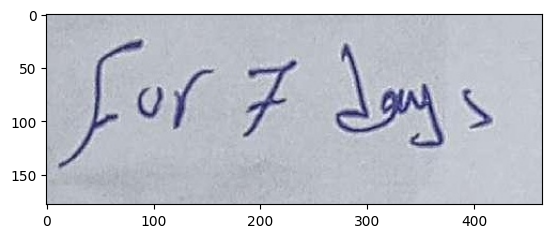

['Every 6 hours']


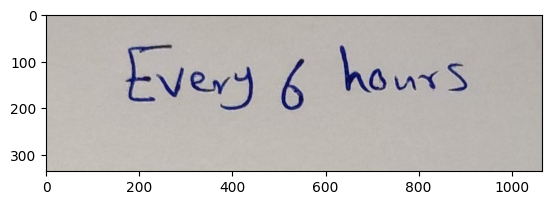

['Every 6 hours']


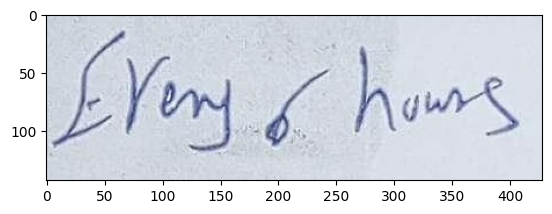

['Cyclosporine']


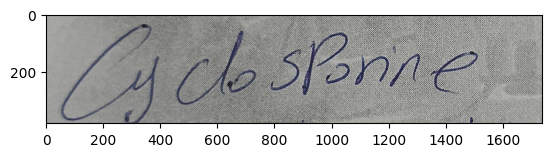

['Night only']


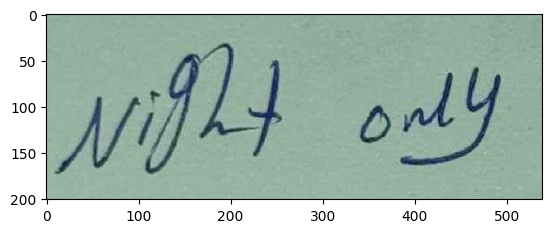

['Metronidazole']


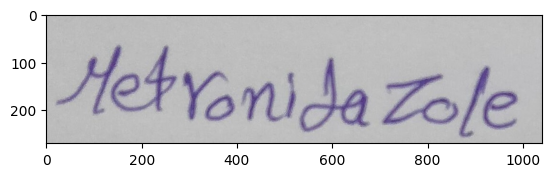

['Mupirocin']


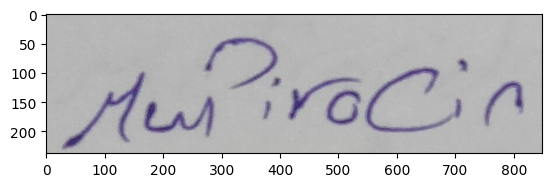

['Every other day']


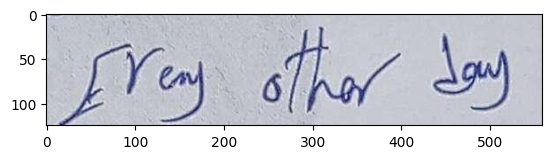

['Collagenne']


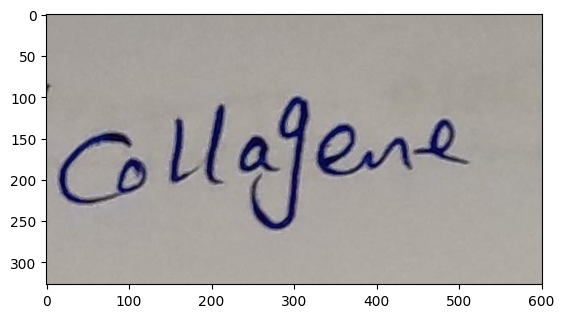

['Lactic Acid']


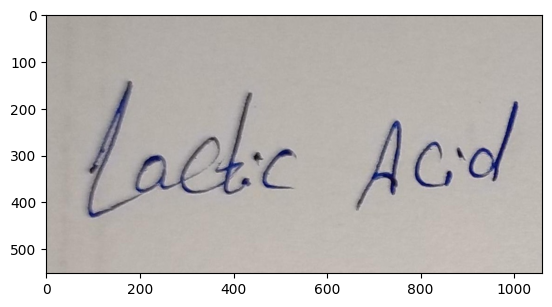

['Timolol']


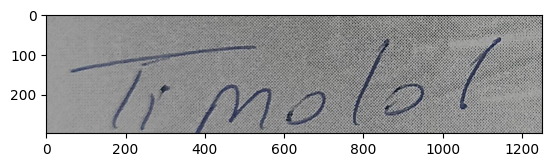

['Once daily']


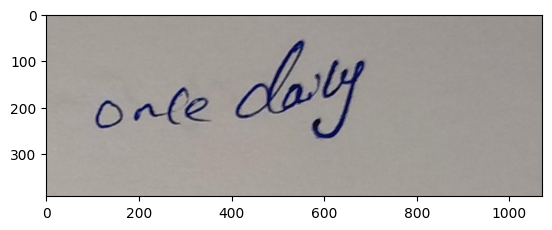

['After lunch']


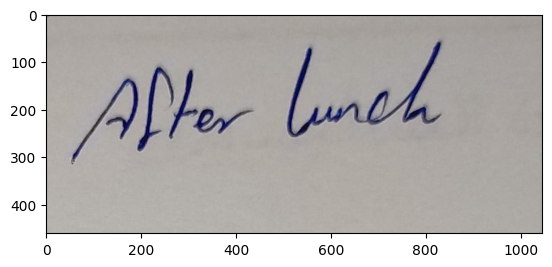

['Ibuprofen']


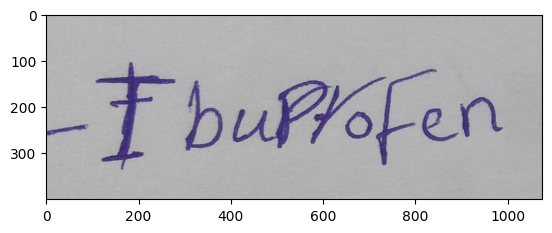

['For 7 days']


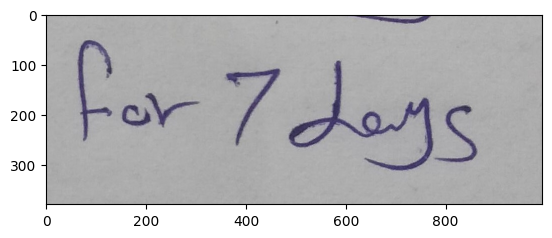

['After meals']


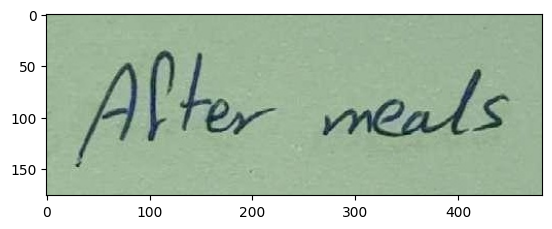

['Every other day']


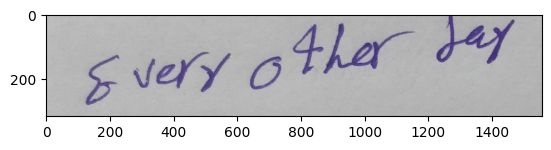

['Erythromycin']


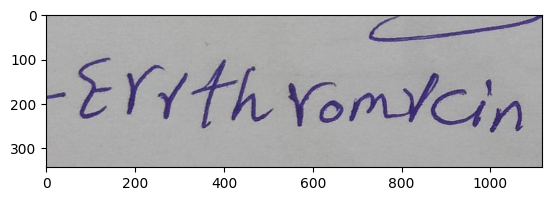

['Every 6 hours']


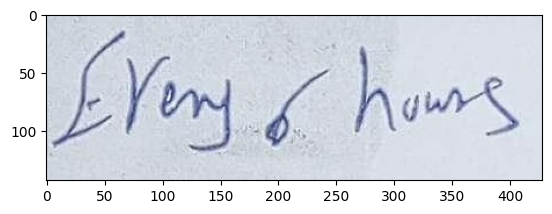

['Every 2 hours']


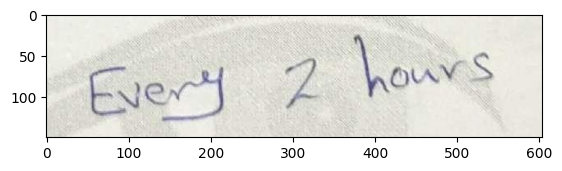

['Erythromycin']


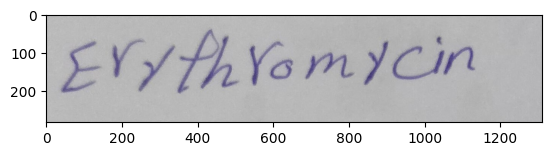

['Every other day']


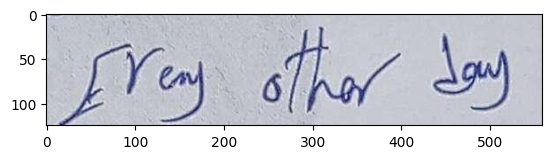

['Dexamethasone']


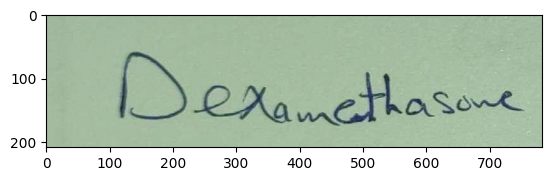

['Cefuroxime']


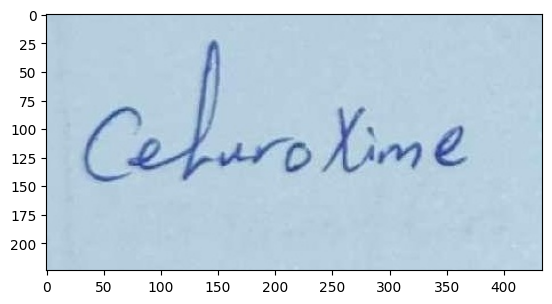

['Every 8 hours']


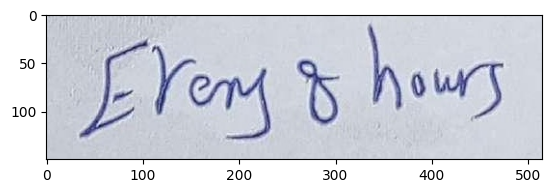

['Every other day']


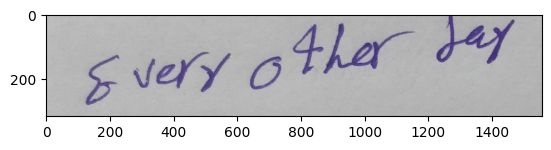

['Collagenne']


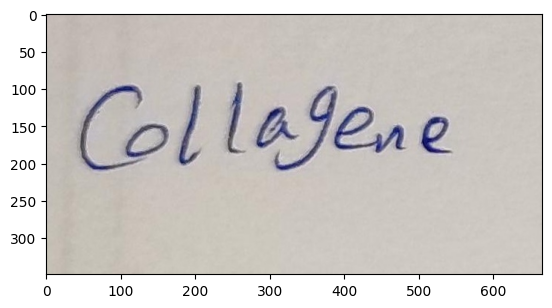

['Once daily']


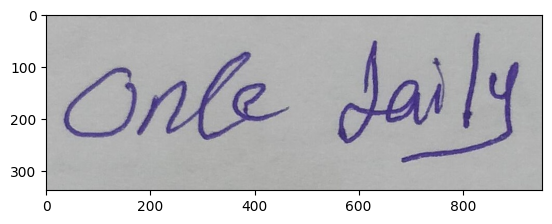

['Once daily']


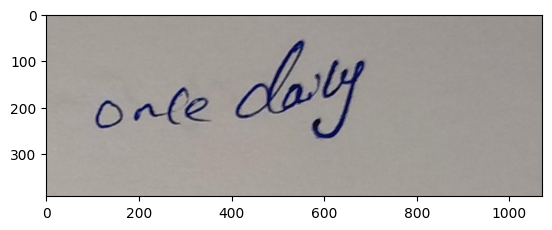

['Topiramate']


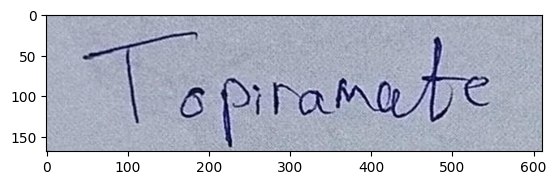

['For the first hour']


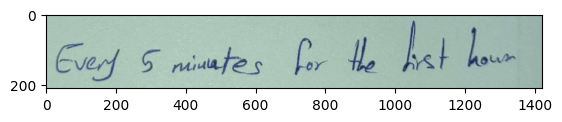

['Paracetamol']


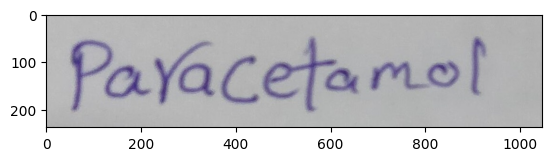

['Twice daily']


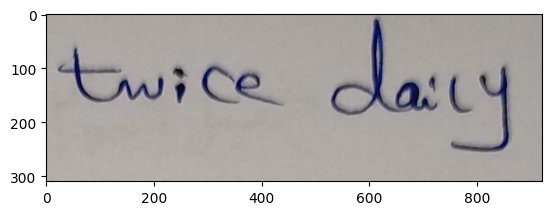

[' only only']


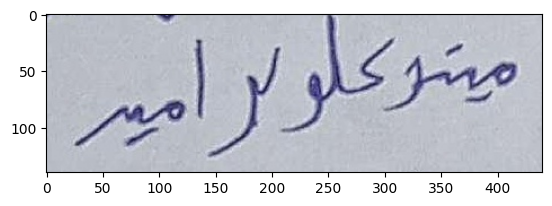

['Every 6 hours']


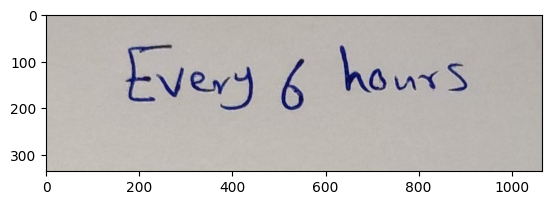

['Mupirocin']


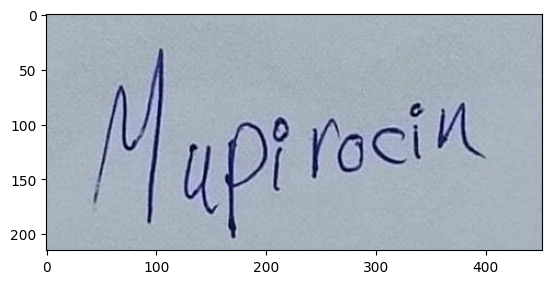

['Mupirocin']


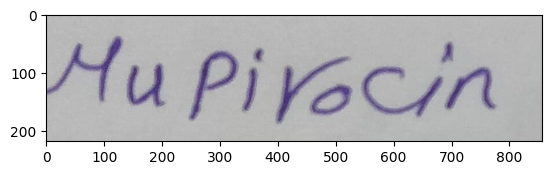

['Diclofenac']


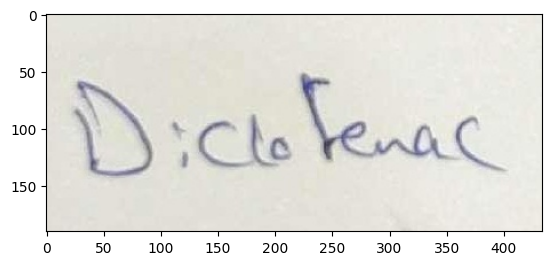

['Every other day']


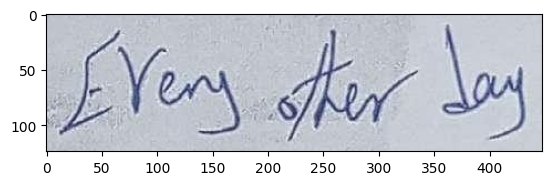

['As needed']


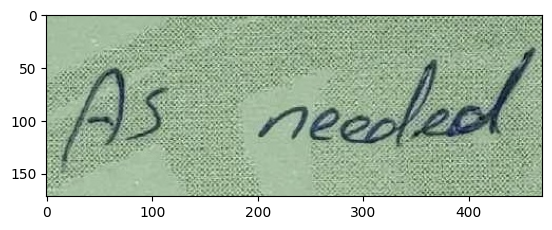

['Lactic Acid']


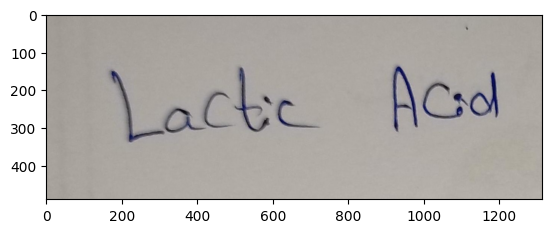

['After meals']


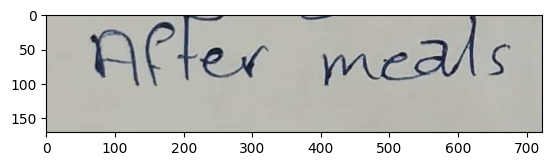

['Azithromycin']


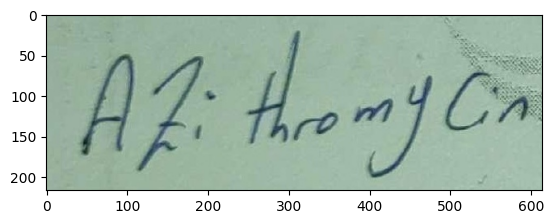

In [39]:
for i in range(50):
    path = os.path.join(base_dir, random.choice(lis))
    predict_path(path, test_processor, test_model)